In [1]:
# Install libraries
%pip install pandas 
%pip install top2vec
%pip install numpy

%pip install matplotlib
%pip install umap-learn[plot]


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
zsh:1: no matches found: umap-learn[plot]
Note: you may need to restart the kernel to use updated packages.


In [9]:
import math
from top2vec import Top2Vec
import numpy as np
import pandas as pd
import pandas as pd
from csv import writer
#import umap.plot
import matplotlib.pyplot as plt
import csv

### PARAMS

In [8]:
path = "data/lem/all"
file_name =  "jerome_synv9_all_blocks_without_residuals_new"  # "jerome_synv9_all"# "jerome_synv9_id" #_NOV_MEM_COL_deep_learn
file_path = path+"/"+file_name + ".txt"
chunk = 5000
divide = "whole books"
txtype_select = []#['NOV: próza', 'MEM: memoáry, autobiografie', 'COL: kratší próza'] 'NOV: próza', 'MEM: memoáry, autobiografie', 'COL: kratší próza'

### LOAD files

In [4]:

def load_books_chunks_from_document(CONST, file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    books = []
    books_info = []
    start_tag = '<doc title="'
    end_tag = '</doc>'
    start_index = 0

    while True:
        book_start = content.find(start_tag, start_index)
        if book_start == -1:
            break

        book_end = content.find(end_tag, book_start)
        if book_end == -1:
            break

        book_text = content[book_start:book_end + len(end_tag)]
        book_info = book_text.strip()[5:book_text.index('>') + 1]  # Remove '<doc' and '</doc>'

        book_info_list = book_info.split('" ')
        book_info_dict = {}

        for item in book_info_list:
            key, value = item.split('=')
            book_info_dict[key.strip()] = value.strip('"')

        book_content = book_text[book_text.index('>') + 1:-len(end_tag)].strip()
        book_content = book_content.split(' ')
        length = len(book_content)
        for i in range(math.ceil(length/CONST)):
            i = i*CONST
            end = i+CONST if i+CONST < length-1 else length-1
            books.append(" ".join(book_content[i:end]))
            books_info.append(book_info_dict)

        start_index = book_end + len(end_tag)

    return books, books_info


def load_books_from_document(file_path, txtype_select):
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    books = []
    books_info = []
    start_tag = '<doc title="'
    end_tag = '</doc>'
    start_index = 0

    while True:
        book_start = content.find(start_tag, start_index)
        if book_start == -1:
            break

        book_end = content.find(end_tag, book_start)
        if book_end == -1:
            break

        book_text = content[book_start:book_end + len(end_tag)]
        book_info = book_text.strip()[5:book_text.index('>') + 1]  # Remove '<doc' and '</doc>'  # Remove '<doc' and '</doc>'

        
        if txtype_select != [] and any([txtype in book_info for txtype in txtype_select]):
            book_info_list = book_info.split('" ') 
            book_info_dict = {}

            for item in book_info_list:
                key, value = item.split('=')
                book_info_dict[key.strip()] = value.strip('"')

            book_content = book_text[book_text.index('>') + 1:-len(end_tag)].strip()        
            books.append(book_content)

            books_info.append(book_info_dict)

        start_index = book_end + len(end_tag)

    return books, books_info



def load_books_blocks_from_document(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    books = []
    books_info = []
    start_tag = '<doc title="'
    end_tag = '</doc>'
    start_index = 0

    while True:
        book_start = content.find(start_tag, start_index)
        if book_start == -1:
            break

        book_end = content.find(end_tag, book_start)
        if book_end == -1:
            break

        book_text = content[book_start:book_end + len(end_tag)]
        book_info = book_text.strip()[5:book_text.index('>') + 1]  # Remove '<doc' and '</doc>'  # Remove '<doc' and '</doc>'

        book_info_list = book_info.split('" ')
        book_info_dict = {}

        for item in book_info_list:
            key, value = item.split('=')
            book_info_dict[key.strip()] = value.strip('"')

        book_content = book_text[book_text.index('>') + 1:-len(end_tag)].strip()
        book_content = book_content.split('\n')
        for book_block in book_content:
            books.append(book_block)
            books_info.append(book_info_dict)

        start_index = book_end + len(end_tag)

    return books, books_info


if divide == "chunk":
    books, books_info = load_books_chunks_from_document(chunk, file_path)
elif divide == "block":    
    books, books_info = load_books_blocks_from_document(file_path)
else:
    books, books_info = load_books_from_document(file_path, txtype_select)    

In [10]:
from read_corpus_functions import load_books_blocks_from_document, load_books_from_document, load_books_chunks_from_document, load_books_from_document_without_residual_ner

#books, books_info = load_books_from_document_without_residual_ner(file_path, txtype_select, 'ner_combined.obj')
#books, books_info = load_books_chunks_from_document(500, file_path)
#books, books_info = load_books_blocks_from_document(file_path=file_path)

books, books_info = load_books_from_document(file_path, txtype_select)

716

In [7]:
file_name = "jerome_synv9_NOV_COL_MEM_VER"

if divide == "chunk":
    d = str(chunk) + " " + divide
    save_path = "models/{divide}/top2vec_".format(divide = d) + file_name
elif divide == "block":
    save_path = "models/{divide}/top2vec_".format(divide = "blocks") + file_name  
else: 
    save_path = "models/{divide}/top2vec_".format(divide = "whole books") + file_name      

In [14]:
books[0]

'" a tak být my mnoho a být povahově velmi rozdílný . muž , s který být se tu setkat , porušit náš zákon . jediný náš omluva být , že být vědět o váš existence . od nynějšek být přístup na tento planeta zakázat , protože se chtít vyhnout vměšování do váš přirozený vývoj . " " ten být od ty velmi šlechetný , přítel , přiznat se , že být mít strach . " asi být být špatně informovaný . ten střecha zmizet jen tak sám od se nebo nějaký kouzlo . " pokrčit rameno . " jít za ostatní . " být oni pět a všechen se tlačit u okno ubikace . " situace být velmi špatný . muset přerušit dosavadní práce a pod Edwinův vedení se být střídat v hlídka . " " ten dlouho vydržet , " namítnout jeden z muž . " být ten jen na několik den . mladý žena se na Marek usmát a ukázat řada pěkný bílý zub . ani tak příjemný obrázek Marek rozveselit a tak jen zavrčet : " kde být . " " mít ponětí . být tu už druhý den místo on . jít rovnou dál , kapitán , být očekávat . " v kancelář Marek na chvíle oslepit slunce , který pr

In [8]:
#umap_args = {'n_neighbors':5, 'n_components':5, 'min_dist':0.1, 'metric':'cosine', 'random_state':42}

# Create the Top2Vec model
top2vec_model = Top2Vec(books, embedding_model="doc2vec", speed='fast-learn', workers = 8) #umap_args=umap_args,

top2vec_model.save(save_path)


2024-04-30 13:57:23,033 - top2vec - INFO - Pre-processing documents for training
2024-04-30 13:57:49,470 - top2vec - INFO - Creating joint document/word embedding
2024-04-30 14:12:40,721 - top2vec - INFO - Creating lower dimension embedding of documents
2024-04-30 14:12:43,709 - top2vec - INFO - Finding dense areas of documents
2024-04-30 14:12:43,720 - top2vec - INFO - Finding topics


In [14]:
#top2vec_model = Top2Vec.load('models/top2vec_jerome_synv9_fast_learn_no_names_without_residuals') #save_path 'models/whole books/top2vec_jerome_synv9_id_no_names_fast_learn'
topic_sizes, topic_nums = top2vec_model.get_topic_sizes()

num_topics = top2vec_model.get_num_topics()

print("Number of topics: ", num_topics)

original_num_topics = num_topics

#for topic_size, topic_num in zip(topic_sizes[:num_topics], topic_nums[:num_topics]):
#    print(f"Topic Num {topic_num} has {topic_size} documents.")

#num_topics = 10
reduced = False
# ret = top2vec_model.hierarchical_topic_reduction(num_topics=num_topics)

# print("Number of topics: ", top2vec_model.get_num_topics(reduced=reduced))

# print(ret)
topic_sizes, topic_nums = top2vec_model.get_topic_sizes(reduced=reduced)
for topic_size, topic_num in zip(topic_sizes[:num_topics], topic_nums[:num_topics]):
    print(f"Topic Num {topic_num} has {topic_size} documents.")


Number of topics:  17
Topic Num 0 has 247 documents.
Topic Num 1 has 241 documents.
Topic Num 2 has 130 documents.
Topic Num 3 has 108 documents.
Topic Num 4 has 108 documents.
Topic Num 5 has 88 documents.
Topic Num 6 has 74 documents.
Topic Num 7 has 66 documents.
Topic Num 8 has 63 documents.
Topic Num 9 has 62 documents.
Topic Num 10 has 58 documents.
Topic Num 11 has 55 documents.
Topic Num 12 has 53 documents.
Topic Num 13 has 46 documents.
Topic Num 14 has 34 documents.
Topic Num 15 has 30 documents.
Topic Num 16 has 27 documents.


In [13]:
# Get the topics and their document clusters
topic_words, word_scores, topics = top2vec_model.get_topics(num_topics=num_topics, reduced=reduced) # Specify the number of topics you want

#topic_number = 0

df_topic_words = pd.DataFrame({"topic {i}".format(i=i):topic_words[i, :] for i in range(num_topics)}) #{"topic 1":topic_words[0, :], "topic 2":topic_words[1, :]}


i = 0

for topic_number in range(num_topics): 
    for words, scores, num in zip(topic_words[topic_number:], word_scores[topic_number:], topics[topic_number:]):
        print(f"Topic {num}")
        for word, score in zip(words, scores):
            print(word, score)

df_topic_words.to_excel("data/topic words/{file_name}.xlsx".format(file_name = file_name))            


Topic 0
on 0.46221843
neco 0.45765847
chvilka 0.45236397
chvile 0.44799146
zase 0.44797722
ja 0.4476524
takhle 0.44700822
jeste 0.44673258
jak 0.44665772
uz 0.44523787
kdyz 0.4437232
hlava 0.4414894
nic 0.4409864
ted 0.439256
porad 0.43883276
uplne 0.43672428
cekat 0.4354485
jen 0.43483114
vypadat 0.43301633
nechat 0.43288925
uvidet 0.4324273
pusa 0.4322189
kuchyne 0.43074164
divat 0.42913356
pokoj 0.4287106
strasne 0.42838603
mama 0.4279477
holka 0.42717868
dlouho 0.4269947
tady 0.42557102
jit 0.42552283
najednou 0.42499608
ty 0.4249863
postel 0.42496797
ruka 0.42414972
par 0.42334136
ale 0.42315236
nekdo 0.42308694
tak 0.42280218
pryc 0.42245495
chtit 0.42215228
pak 0.42209917
dal 0.42180339
jako 0.42162687
oni 0.42037222
moc 0.4196957
noha 0.41788566
tam 0.41716632
hrozne 0.4168968
zada 0.41645285
Topic 1
turista 0.5784121
cestovatel 0.47834548
vnitrozemi 0.45909092
peruansky 0.45809516
kilometr 0.45754266
ostrov 0.4534614
turisticky 0.44866815
jizni 0.44198152
africky 0.441877
isla

In [9]:
print(len(books[0]))

150156


In [21]:
documents, document_scores, document_ids = top2vec_model.search_documents_by_topic(topic_num=0, num_docs=40, reduced=reduced)

for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()
 

Document: 211, Score: 0.5069069266319275
-----------
tchán točit pivo jako vždy , když vejít s do výčep , shýbnout se do basa pro červený limonáda , být tam vedro , , napít se , jistě mít žízeň . vajgl na podlaha , podlaha černě tečkovaný , i když on tchyně vydrhnout písek , to jak chlap zadupávat hořící cigareta bota . tchán sto zorka denně , však na ten také umřít . tchyně také ani slovo . jakmile on uvidět , letět k on , všechen nechat a letět k svůj a on chytit do náruč a pak se on posadit na klín a přes její hlava hrát karta . občas on vlepit pusa , takový mlaskavý pusa , a se bořit hlava do jeho košile , který být povětšinou bez knoflíček , a poslouchat jeho dech , jeho srdce , jeho hlas . tak co , jít spolu na pouť , ? pučet já ty babička ? aniž se ten uvědomovat , počítat vždy s šlechetnost Francová , a počítat správně , a teď tentýž chtít na : ani tady se zmýlit . přikývnout . jít . jistěže jít . babička sedět na schod z předsíň do sednice , noha v kostkovaný bačkora , s cvikr

In [22]:
print(len(books_info))

1490


In [10]:
print(top2vec_model.doc_top)

#ret = top2vec_model.hierarchical_topic_reduction(num_topics=num_topics)

doc_top_reduced = [0] * (len(books_info))
for topic_num in range(num_topics): 
    print(topic_num)
    documents, document_scores, document_ids = top2vec_model.search_documents_by_topic(topic_num=topic_num, num_docs=topic_sizes[topic_num], reduced=reduced)
    #print(document_ids)
    for document_id, document_score in zip(document_ids, document_scores):
        print(document_id)
        doc_top_reduced[document_id] = topic_num +1
        books_info[document_id]['topic'] = topic_num +1
        books_info[document_id]['score'] = document_score
doc_top_reduced = np.array(doc_top_reduced)    

df_books_info = pd.DataFrame(books_info) #_{txtype}
df_books_info.to_excel('data/books info/{divide}/books_info_{file_name}.xlsx'.format(divide = divide, file_name = file_name))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 1 0 

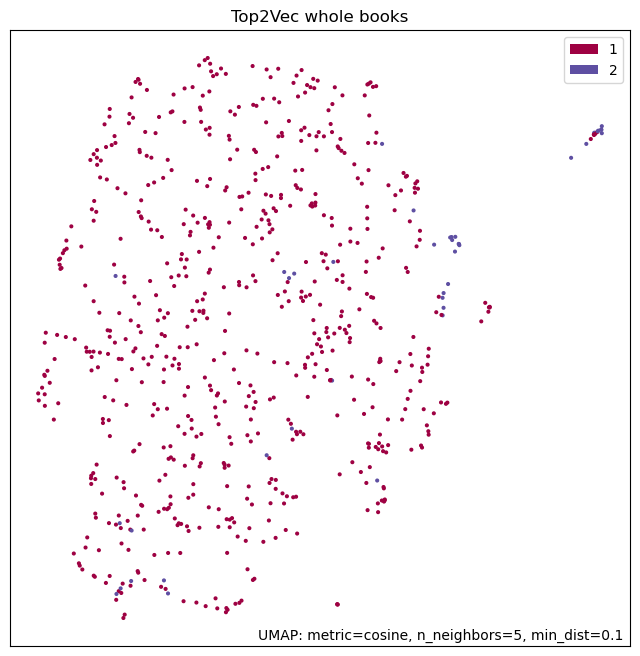

In [12]:
#num_topics = 10
import umap.plot


#top2vec_model = Top2Vec.load(save_path)
#ret = top2vec_model.hierarchical_topic_reduction(num_topics=num_topics)


# # Get the document-topic vectors (embeddings)
# embeddings = top2vec_model.get_documents_topics(doc_ids=list(range(0, len(books))))

umap_args_model = {
"n_neighbors": 5,
"n_components": 2,
"metric": "cosine",
'min_dist':0.1,
'spread':1,
'random_state': 42
}
umap_model = umap.UMAP(**umap_args_model).fit(top2vec_model.document_vectors)

umap.plot.points(umap_model, labels=doc_top_reduced ) #


#plt.legend([])

plt.title('Top2Vec whole books')

# plt.xlabel('UMAP Dimension 1')
# plt.ylabel('UMAP Dimension 2')
plt.show()

In [11]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import TfidfVectorizer

file = 'top2vec_umap_n_n15_hdbscan_m_c_s15_doc2vec_new'
model_path = 'models/whole books/top2vec/{file}'.format(file = file)
top2vec_model = Top2Vec.load(model_path)

bertopic_model = BERTopic()

vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(books)

In [13]:
X.A

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00130868, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [7]:
top2vec_model.words

AttributeError: 'Top2Vec' object has no attribute 'words'

In [5]:
bertopic_model._extract_words_per_topic()

TypeError: BERTopic._extract_words_per_topic() missing 2 required positional arguments: 'words' and 'documents'